In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import lightning as L 
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image

import wandb

with open('/workspace/wandb.key', 'r') as f:
    wandb_key = f.read().strip()
    
print('Logging in to wandb...')
wandb.login(key=wandb_key)

# Check if CUDA is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Logging in to wandb...


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: ignacy-stepka (team-ignacy). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [2]:
L.seed_everything(42)
np.random.seed(42)

Seed set to 42


In [3]:
config={
    "learning_rate": 1e-3,
    "architecture": "Encoder-Decoder",
    "epochs": 10,
    "fill": 'black', # Can be also white
    "model": 'UNet', # Can be also UNet
    "loss": 'mse',
}

In [4]:
wandb.init(
    project="lightning",
    name="UNet-withoutBatchNorm",
    config=config,
)

In [5]:
DATA_DIRECTORY = '/workspace/data/splits/'
train_dir = os.path.join(DATA_DIRECTORY, 'train')
val_dir = os.path.join(DATA_DIRECTORY, 'val')
test_dir = os.path.join(DATA_DIRECTORY, 'test')


def load_images_from_dir(dir: str) -> np.array:
    images = []
    for filename in os.listdir(dir):
        if any([filename.lower().endswith(x) for x in ['.jpg', '.png', '.jpeg']]):
            image = Image.open(os.path.join(dir, filename))
            images.append(np.array(image))
    return np.array(images)

# Load images
train_images = load_images_from_dir(train_dir) / 255.0
val_images = load_images_from_dir(val_dir) / 255.0
test_images = load_images_from_dir(test_dir) / 255.0

print(f'Loaded {len(train_images)} training images')
print(f'Loaded {len(val_images)} validation images')
print(f'Loaded {len(test_images)} test images')

Loaded 1200 training images
Loaded 400 validation images
Loaded 400 test images


Let's see a couple of image examples from the training set

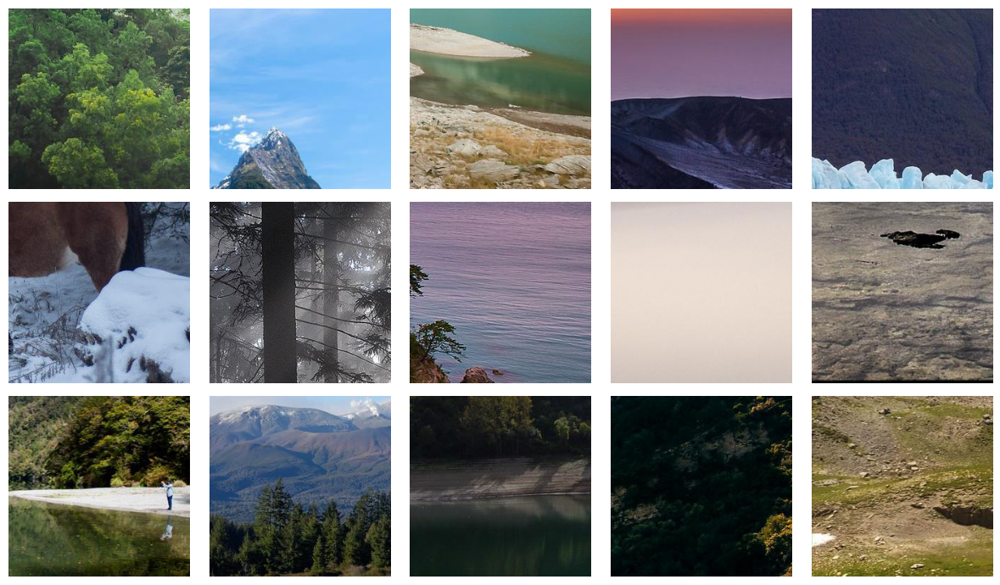

In [6]:
fig, ax = plt.subplots(3, 5, figsize=(12, 7))
ax = ax.flatten()
for i in range(15):
    ax[i].imshow(train_images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.savefig('train_images.png', dpi=300)

# Log images to wandb
wandb.log({"train_images_sample": wandb.Image('train_images.png')})

plt.show()

Now let's define a couple of masks that will serve for masking the images for the purpose of learning how to inpaint the missing pixels.

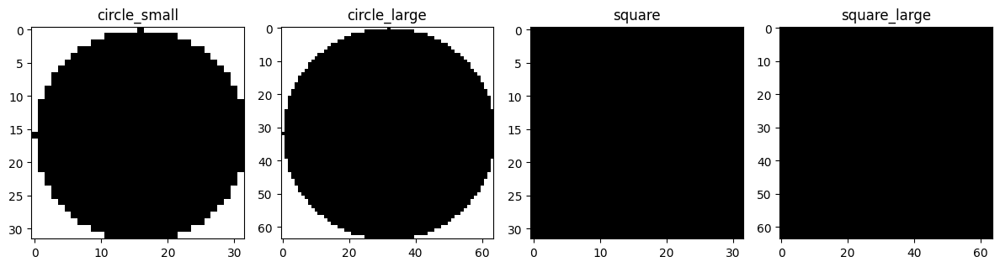

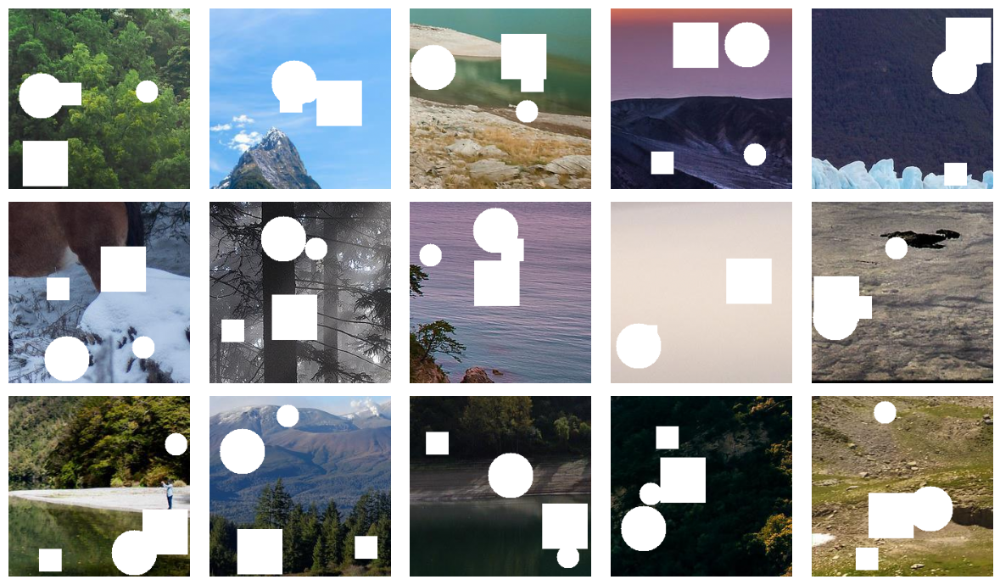

In [7]:
# Create a couple of shapes that will be used to randomly paste onto the images
def create_circle(size: int) -> np.array:
    circle = np.zeros((size, size))
    x, y = np.indices((size, size))
    circle = np.logical_or(circle, (x - size//2)**2 + (y - size//2)**2 <= (size//2)**2)
    circle3D = np.zeros((size, size, 3))
    circle3D[:, :, 0] = circle
    circle3D[:, :, 1] = circle
    circle3D[:, :, 2] = circle
    return circle3D.astype(np.uint8)

def create_square(size: int) -> np.array:
    square = np.zeros((size, size))
    square = np.logical_or(square, np.ones((size, size)))
    square3D = np.zeros((size, size, 3))
    square3D[:, :, 0] = square
    square3D[:, :, 1] = square
    square3D[:, :, 2] = square
    return square3D.astype(np.uint8)

# Create a function that will randomly paste shapes onto the images
def paste_shape(image: np.array, shape: np.array) -> np.array:
    assert image.shape[2] == shape.shape[2], \
        f'Image and shape must have the same channel dimensions but got {image.shape} and {shape.shape}'
    
    # Randomly choose a location to paste the shape
    x = np.random.randint(0, image.shape[0] - shape.shape[0])
    y = np.random.randint(0, image.shape[1] - shape.shape[1])
    
    # Create a mask of the shape
    mask = shape == 1
    
    # Paste the shape onto the image
    image[x:x+shape.shape[0], y:y+shape.shape[1], :] = np.where(mask, shape, image[x:x+shape.shape[0], y:y+shape.shape[1], :])
    
    return image


circle_small = create_circle(32)
circle_large = create_circle(64)
square = create_square(32)
square_large = create_square(64)

masks = [circle_small, circle_large, square, square_large]
mask_names = ['circle_small', 'circle_large', 'square', 'square_large']

# Show the shapes
fig, ax = plt.subplots(1, 4, figsize=(12, 3))
for i in range(4):
    ax[i].imshow(255 - masks[i] * 255)
    ax[i].set_title(mask_names[i])
    
plt.tight_layout()
plt.savefig('mask_shapes.png', dpi=300)

wandb.log({"mask_shapes": wandb.Image('mask_shapes.png')})
plt.show()

# Example of applying the masks to an image
fig, ax = plt.subplots(3, 5, figsize=(12, 7))
ax = ax.flatten()

for i in range(15):
    image = train_images[i].copy()
    for mask in masks:
        image = paste_shape(image, mask)
    ax[i].imshow(image)
    ax[i].axis('off')
    
plt.tight_layout()
plt.savefig('train_images_with_shapes.png', dpi=300)

wandb.log({"train_images_with_shapes": wandb.Image('train_images_with_shapes.png')})
plt.show()

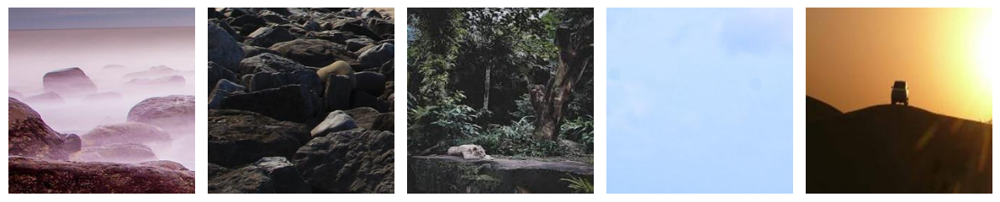

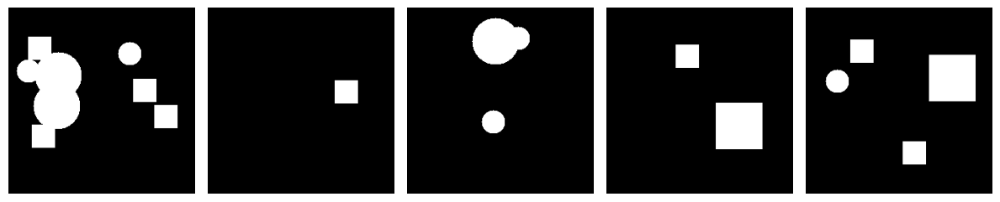

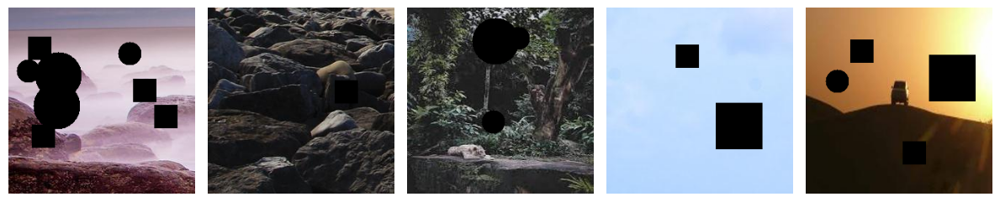

In [8]:
# Create a dataset class
class ShapesDataset(torch.utils.data.Dataset):
    def __init__(self, images: np.array, masks: list, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = self.images[idx].copy()
        mask = np.zeros_like(image)
        
        # Randomly choose a number of shapes to paste onto the image
        num_shapes = np.random.randint(1, 10)
        
        ms = [self.masks[i] for i in np.random.randint(0, len(self.masks), num_shapes)]
        masked_image = image.copy()
        
        for m in ms:
            mask = paste_shape(mask, m)
        
        if config['fill'] == 'black':
            masked_image = masked_image * (1-mask)
        else:
            masked_image = masked_image * mask
            
        sample = {'image': image, 'mask': mask, 'masked_image': masked_image.copy()}
        
        if self.transform:
            sample = self.transform(sample)
        return sample
    
# Create a transform class to convert the images to tensors
class ToTensor(object):
    def __call__(self, sample):
        image, mask, masked_image = sample['image'], sample['mask'], sample['masked_image']
        image = image.transpose((2, 0, 1))
        mask = mask.transpose((2, 0, 1))
        masked_image = masked_image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image).float(),
                'mask': torch.from_numpy(mask).float(),
                'masked_image': torch.from_numpy(masked_image).float()}
        
# Create the datasets
train_dataset = ShapesDataset(train_images, masks, transform=ToTensor())
val_dataset = ShapesDataset(val_images, masks, transform=ToTensor())
test_dataset = ShapesDataset(test_images, masks, transform=ToTensor())

# Create the dataloaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)

# Create a function to show the images
def show_images(images: torch.Tensor, num_images: int=5, wandb_save_name: str = None, show_plot_locally: bool = True):
    fig, ax = plt.subplots(1, num_images, figsize=(12, 3))
    for i in range(num_images):
        # print(images[i].shape, images[i].max(), images[i].min())
        ax[i].imshow(images[i].permute(1, 2, 0))
        ax[i].axis('off')
    plt.tight_layout()
    
    if wandb_save_name:
        plt.savefig(wandb_save_name, dpi=300)
        wandb.log({wandb_save_name: wandb.Image(wandb_save_name)})
    if show_plot_locally:
        plt.show()
    
# Show a batch of images
for batch in train_loader:
    show_images(batch['image'], wandb_save_name='batch_ex-train_images.png')
    show_images(batch['mask'], wandb_save_name='batch_ex-train_masks.png')
    show_images(batch['masked_image'], wandb_save_name='batch_ex-train_masked_images.png')
    break

In [9]:
# Define the Encoder-Decoder model that takes in an image, a mask, and a masked image
# Then it tries to reconstruct the original image using the masked image and the mask

class EncoderDecoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, 3, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, padding='same'),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 3, padding='same'),
            nn.BatchNorm2d(256),
        )
        
        self.decoder = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding='same'),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 64, 3, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 3, 3, padding='same'),
            nn.Hardtanh(min_val=0, max_val=1),
        )
        
    def forward(self, mask, masked_image):
        x = torch.cat([mask, masked_image], dim=1)
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [10]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        # Small unet model
        
        self.encoder1 = nn.Sequential(
            nn.Conv2d(6, 64, 3, padding='same'),
            # nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding='same'),
            # nn.BatchNorm2d(64),
        )
        
        self.encoder2 = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, padding='same'),
            # nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding='same'),
            # nn.BatchNorm2d(128),
        )
        
        self.encoder3 = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(128, 256, 3, padding='same'),
            # nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding='same'),
            # nn.BatchNorm2d(256),
        )
        
        self.bottle_neck = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding='same'),
            # nn.BatchNorm2d(256),
        )
        
        self.decoder1 = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(512, 128, 3, padding='same'),
            # nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding='same'),
            # nn.BatchNorm2d(128),
        )
        
        self.decoder2 = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(256, 64, 3, padding='same'),
            # nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding='same'),
            # nn.BatchNorm2d(64),
        )
        
        self.decoder3 = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(128, 3, 3, padding='same'),
            nn.Tanh(),
        )
        
    def forward(self, mask, masked_image):
        x = torch.cat([mask, masked_image], dim=1)
        
        x1 = self.encoder1(x)
        x2 = self.encoder2(F.max_pool2d(x1, 2))
        x3 = self.encoder3(F.max_pool2d(x2, 2))
        
        x = self.bottle_neck(F.max_pool2d(x3, 2))
        
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        x = torch.cat([x, x3], dim=1)
        x = self.decoder1(x)
        
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        x = torch.cat([x, x2], dim=1)
        x = self.decoder2(x)
        
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        x = torch.cat([x, x1], dim=1)
        x = self.decoder3(x)
        
        return x

In [11]:
# Define the LightningModule
from typing import Any


from lightning.pytorch.utilities.types import STEP_OUTPUT


class ImageInpainting(L.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model
        
    def forward(self, mask, masked_image):
        return self.model(mask, masked_image)
    
    def training_step(self, batch, batch_idx):
        image, mask, masked_image = batch['image'], batch['mask'], batch['masked_image']
        output = self(mask, masked_image)
        loss = F.mse_loss(output, image)
        wandb.log({'train_loss': loss})
        wandb.log({'train_l1_loss': F.l1_loss(output, image)})
        return loss
    
    def validation_step(self, batch, batch_idx):
        image, mask, masked_image = batch['image'], batch['mask'], batch['masked_image']
        output = self(mask, masked_image)
        loss = F.mse_loss(output, image)
        l1_loss = F.l1_loss(output, image)
        wandb.log({'val_loss': loss})
        wandb.log({'val_l1_loss': l1_loss})
        return loss
    
    def test_step(self, batch, batch_idx):
        image, mask, masked_image = batch['image'], batch['mask'], batch['masked_image']
        output = self(mask, masked_image)
        loss = F.mse_loss(output, image)
        l1_loss = F.l1_loss(output, image)
        wandb.log({'test_loss': loss})
        wandb.log({'test_l1_loss': l1_loss})
        return loss
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)
    
    def on_test_batch_end(self, outputs: STEP_OUTPUT, batch: Any, batch_idx: int, dataloader_idx: int = 0) -> None:
        
        if batch_idx == 0:
            image, mask, masked_image = batch['image'], batch['mask'], batch['masked_image']
            output = self(mask, masked_image)
            show_images(image.cpu().detach(), wandb_save_name='test_images.png', show_plot_locally=False)
            show_images(masked_image.cpu().detach(), wandb_save_name='test_masked_images.png', show_plot_locally=False)
            show_images(output.cpu().detach(), wandb_save_name='test_output.png', show_plot_locally=False)
        
        return super().on_test_batch_end(outputs, batch, batch_idx, dataloader_idx)
    
    def on_train_batch_end(self, outputs: STEP_OUTPUT, batch: Any, batch_idx: int, dataloader_idx: int = 0) -> None:
        
        if batch_idx == 0:
            image, mask, masked_image = batch['image'], batch['mask'], batch['masked_image']
            output = self(mask, masked_image)
            show_images(image.cpu().detach(), wandb_save_name=f'train_images_{self.current_epoch}.png', show_plot_locally=False)
            show_images(masked_image.cpu().detach(), wandb_save_name=f'train_masked_images_{self.current_epoch}.png', show_plot_locally=False)
            show_images(output.cpu().detach(), wandb_save_name=f'train_output_{self.current_epoch}.png', show_plot_locally=False)

        return super().on_train_batch_end(outputs, batch, batch_idx)

In [12]:
# Torch clean up caches
torch.cuda.empty_cache()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:67: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
You are using a CUDA device ('NVIDIA RTX A5000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#to

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:293: The number of training batches (38) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

/tmp/ipykernel_4932/1921318940.py:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, num_images, figsize=(12, 3))


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

[{}]

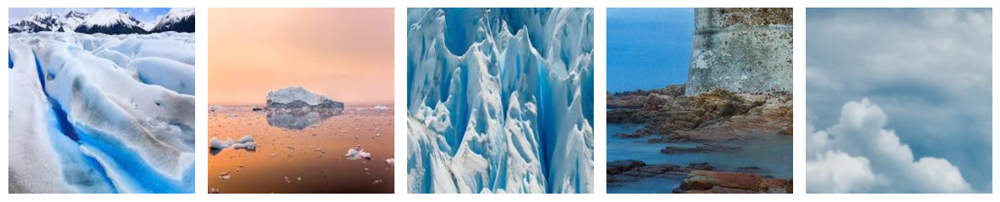

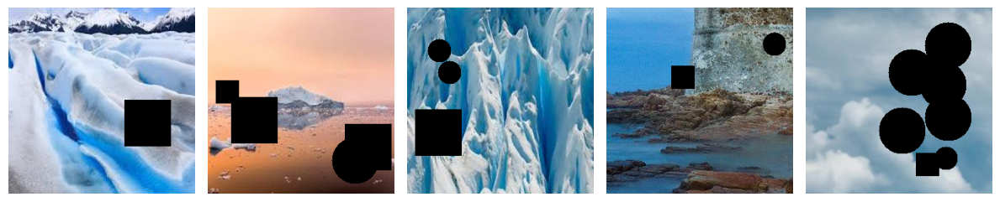

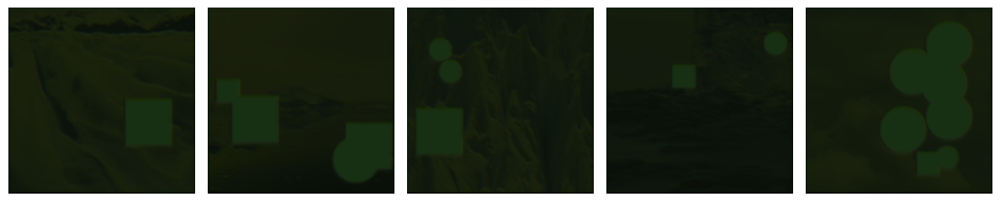

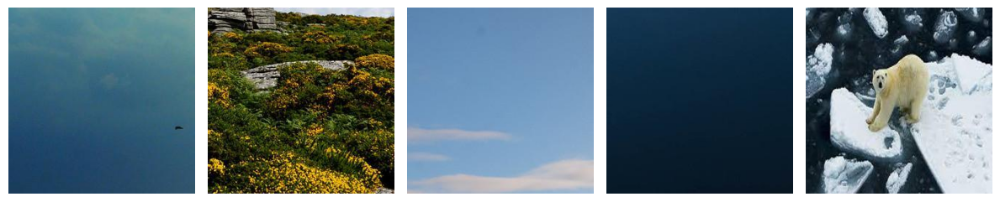

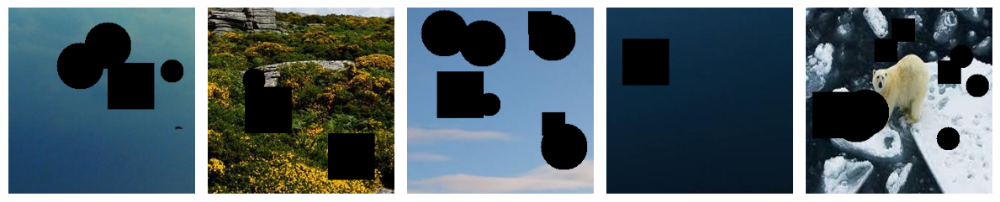

...

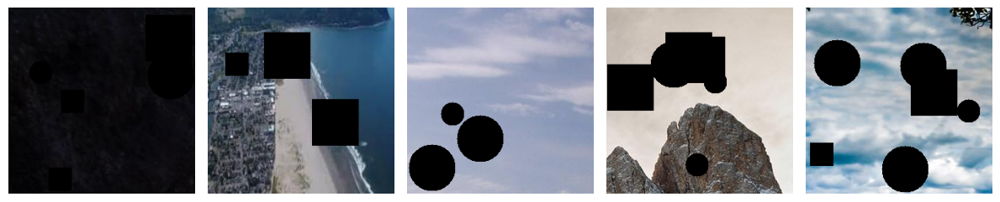

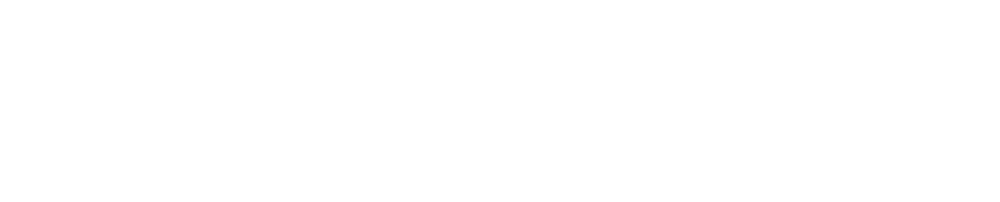

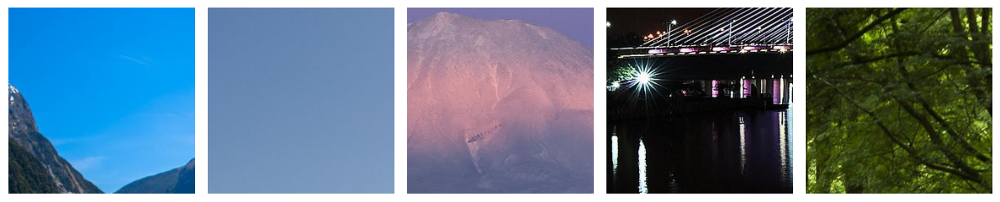

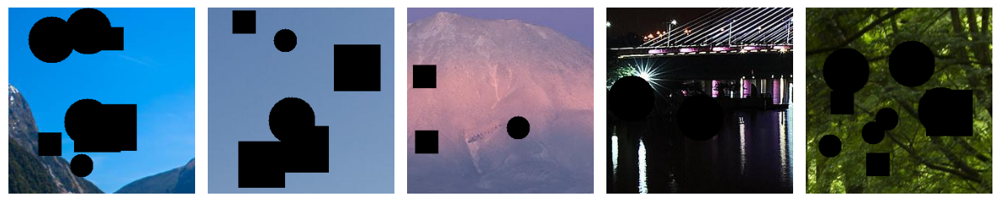

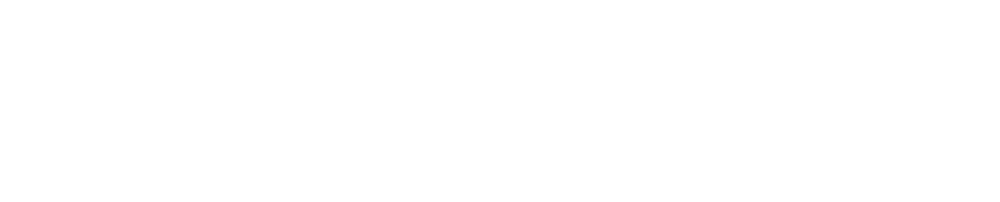

In [13]:
# Create the model
if config['model'] == 'Encoder-Decoder':
    model = EncoderDecoder()
elif config['model'] == 'UNet':
    model = UNet()
else:
    raise ValueError(f'Unknown model {config["model"]}')

# Create the LightningModule
lightning_module = ImageInpainting(model)

# Create the trainer
trainer = L.Trainer(max_epochs=config['epochs'])

# Train the model
trainer.fit(lightning_module, train_loader, val_loader)

# Test the model
lightning_module.eval()
lightning_module.freeze()
trainer.test(lightning_module, test_loader)

FININSH

In [14]:
wandb.finish()

test_l1_loss,▁▅██▆▂▂█▂▁▂▇▃
test_loss,▁▅▇▇▅▃▂█▂▂▂▆▄
train_l1_loss,▅▃▅▄▂▄▃▆▅▅▅▅▄▃▅▇▄▇▆▅▅▄▅▆▆▆▆▅▆▆▁▄▂▇▄▆▃▁█▂
train_loss,▄▃▅▄▁▄▃▆▅▄▄▅▄▂▅▇▄▇▅▄▄▄▅▆▆▅▅▅▆▆▁▃▂▇▄▆▃▂█▂
val_l1_loss,▁█▅▃▄▇▅▄▆▆▅▃▅▇▅▄▆▆▅▃▅▅▅▄█▆▅▄▅▅▄▄█▅▅▄▇▅▄▆
val_loss,▁█▅▃▄▇▄▅▅▅▅▃▅▇▄▄▅▅▅▃▅▅▄▄█▅▅▄▅▅▅▄█▅▅▄▇▅▅▅
test_l1_loss,0.49904
test_loss,0.33597
train_l1_loss,0.4776
train_loss,0.30062
val_l1_loss,0.54566
